In [ ]:
# web scraping with topic model & TF-IDF 

In [156]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pandas as pd

n_features = 1000
n_topics = 9
n_top_words = 500

reviews_movie = pd.read_csv('data2/reviews_movie.csv', encoding = "ISO-8859-1", error_bad_lines=False)
# review_detail = [row[0] for row in reviews_movie]
tf_review_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=n_features,
                                stop_words='english')
tf_review = tf_review_vectorizer.fit_transform(reviews_movie.iloc[:,0])
# print('loaded_vectorizer.get_feature_names(): {0}'.
#   format(tf_review_vectorizer.get_feature_names()))

In [157]:

from time import time

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.datasets import fetch_20newsgroups

def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic #%d:" % topic_idx)
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
        print
        
def get_top_words(model, feature_names, n_top_words):
    top_words = []
    for topic_idx, topic in enumerate(model.components_):
        top_words.append([topic_idx, " ".join([feature_names[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]])])
        
    return top_words

In [158]:
print type(tf_review)
print tf_review[0]
print type(tf_review.toarray())

print '-' * 50
print tf_review.toarray().shape
print tf_review.toarray()[11313, 300: 310]

<class 'scipy.sparse.csr.csr_matrix'>
  (0, 995)	1
  (0, 627)	1
  (0, 577)	1
  (0, 69)	1
  (0, 205)	1
<type 'numpy.ndarray'>
--------------------------------------------------
(13467, 1000)
[0 0 0 0 0 0 0 0 0 0]


In [159]:
print("Fitting LDA models with tf features, n_features=%d..."
      % n_features)
lda_re = LatentDirichletAllocation(n_topics=n_topics, max_iter=5,
                                learning_method='online', learning_offset=50.,
                                random_state=0)
t0 = time()
lda_re.fit(tf_review)
print("done in %0.3fs." % (time() - t0))

Fitting LDA models with tf features, n_features=1000...
done in 8.464s.


In [160]:
lda_re.components_[0]

array([  1.11567617e-01,   1.14010068e-01,   6.20790856e+00,
         1.11278207e-01,   1.11155329e-01,   5.52750629e+00,
         4.74617041e+01,   1.11137918e-01,   1.11148860e-01,
         1.41728106e+01,   1.12122639e-01,   1.11188262e-01,
         1.11139222e-01,   4.67426831e+01,   1.11168245e-01,
         1.11206194e-01,   2.83244383e+01,   1.11172156e-01,
         1.11139408e-01,   1.11195190e-01,   1.11170403e-01,
         1.11195881e-01,   1.12354850e-01,   1.05219527e+02,
         1.11174056e-01,   1.11156622e-01,   1.11434050e-01,
         1.11162219e-01,   1.11272859e-01,   1.11216652e-01,
         1.11161767e-01,   1.11230665e-01,   1.13941207e-01,
         1.11145726e-01,   1.11131149e-01,   1.11132002e-01,
         1.11189017e-01,   9.72941229e+01,   1.11145358e-01,
         1.11169234e-01,   1.11163785e-01,   1.16019504e-01,
         1.11646142e-01,   1.11184513e-01,   1.11187495e-01,
         1.11198472e-01,   6.41503771e+00,   1.11209646e-01,
         1.11159317e-01,

In [161]:
lda_re.components_.shape

(9, 1000)

In [162]:
tf_re_feature_names = tf_review_vectorizer.get_feature_names()
topic_top_words = get_top_words(lda_re, tf_re_feature_names, n_top_words)

topic_0 = topic_top_words[0][1]
# print topic_0
print topic_top_words[2]

[2, u'film little horror sense like star come finding drama look dory people genre world study dream linklater tension things filmmaking edge shot turns instead trek embrace camera enjoy breathe leaves images hell serpent witch good line talent remains quietly fences cut suspense effective brilliant extraordinary reality simply place fan contemporary acted means performance humanity fresh era impact western gives family mood seat hunt humour wilderpeople real better faith historical girl important danger essential pace change looks barbershop exploration word effect ordinary everyday special women guerra subtle atmosphere mr written start understand actor poetic exercise thrills doubt home living seventeen depth appreciate inspired darkness eyes scares using personal called deeply surreal dance natural barely effects felt documentary psychological wrong eggers flick seen female man getting driven story style woman merely bit slowly young predecessor grand captures standard probably tol

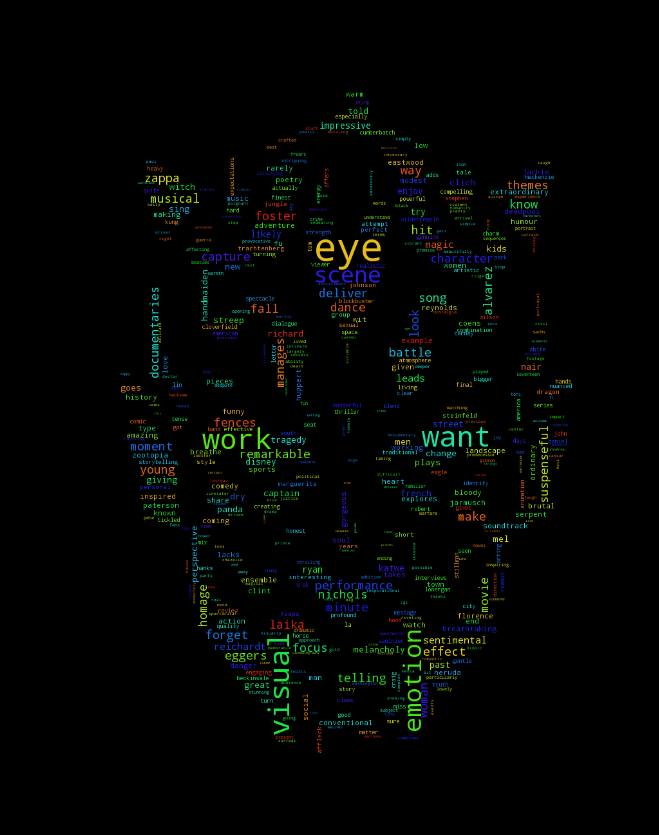

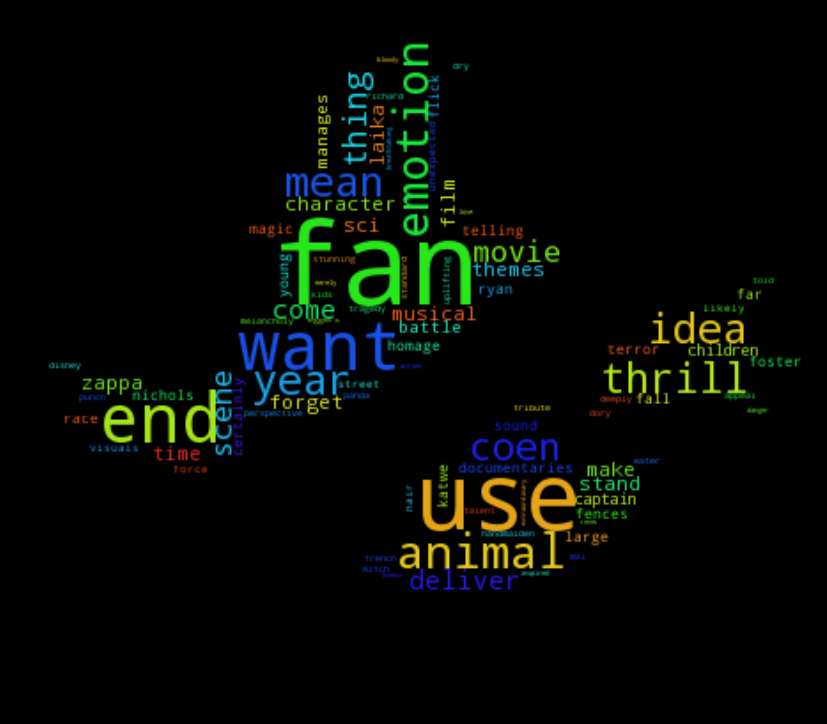

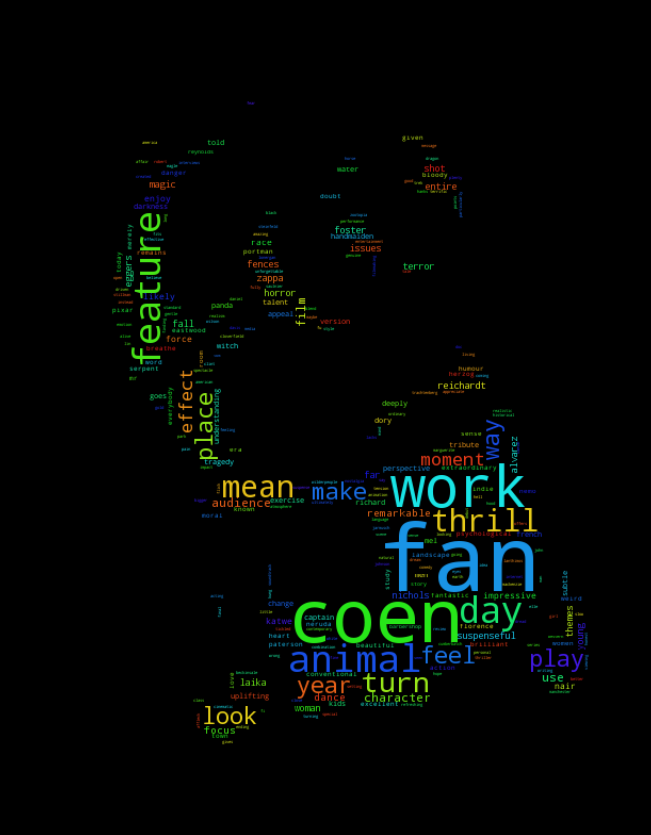

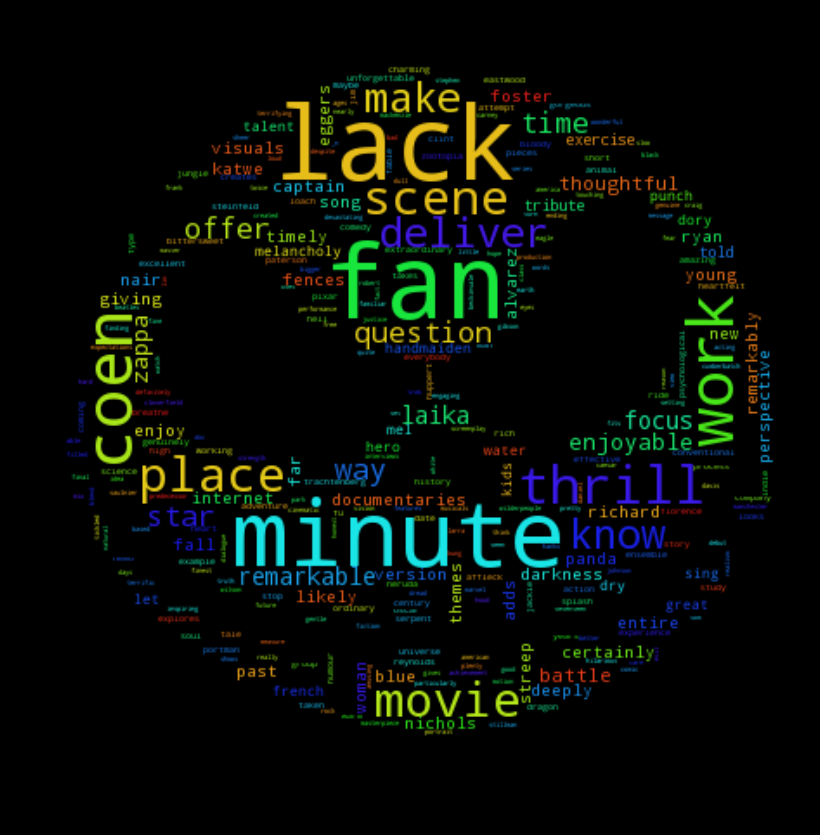

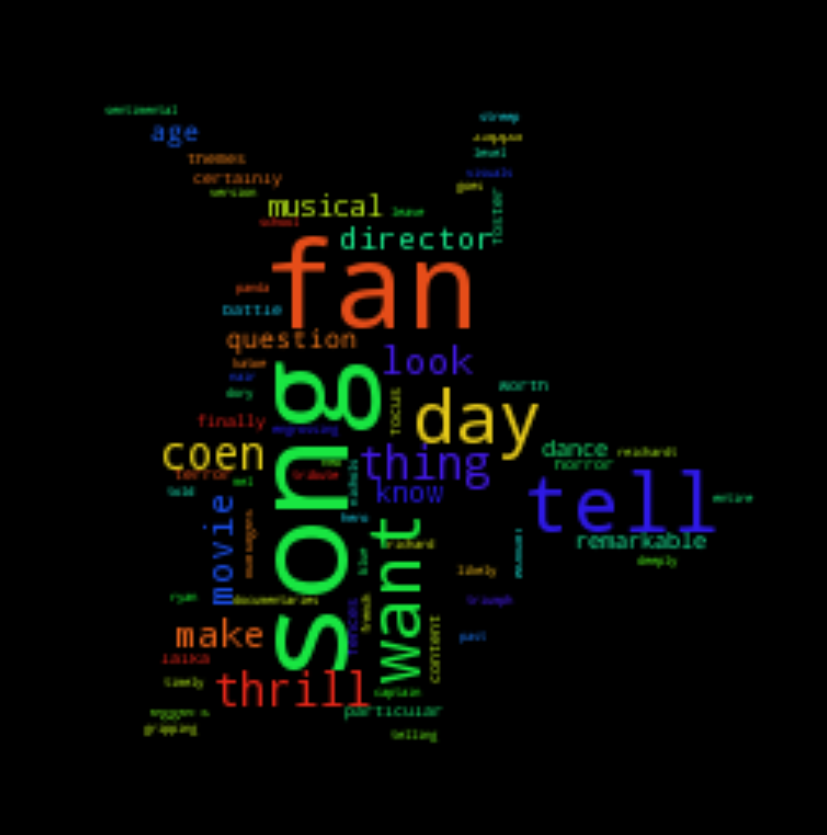

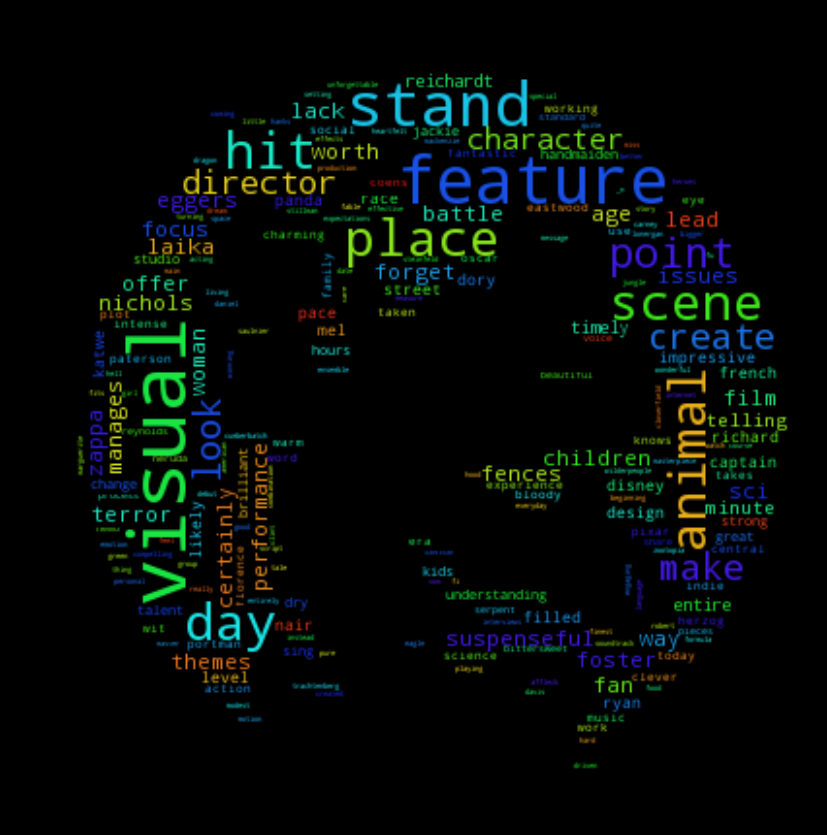

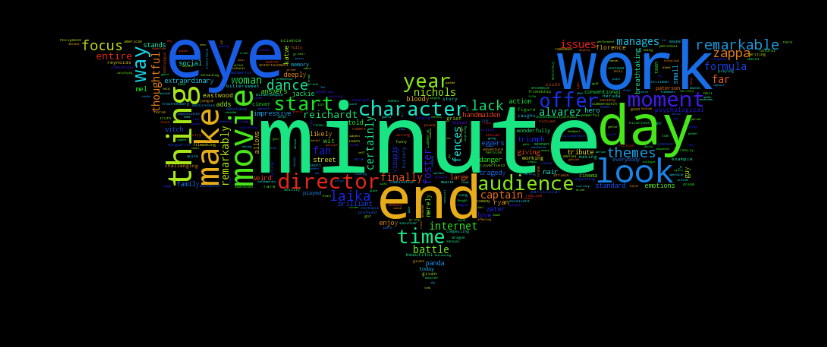

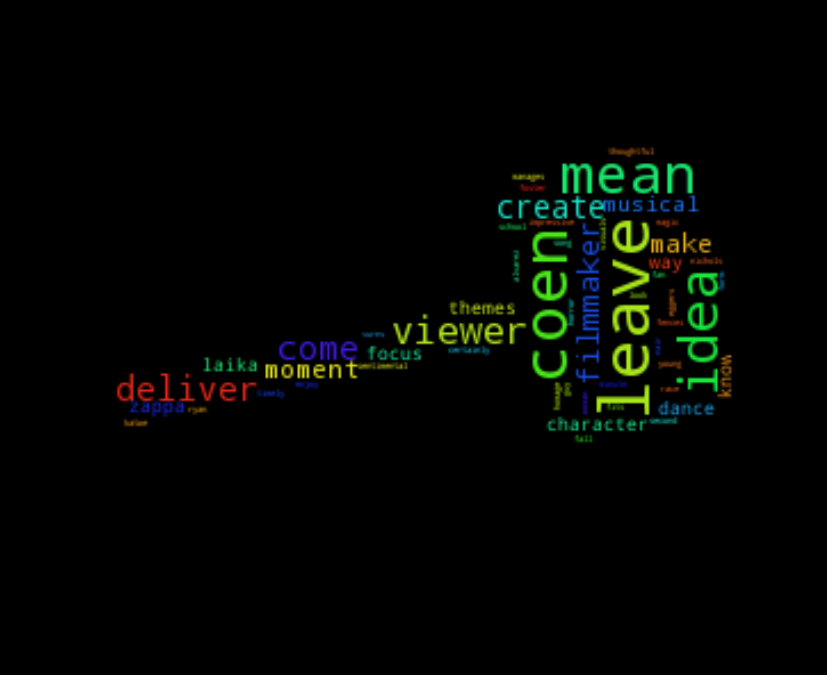

KeyError: '9'

In [163]:
for i in range(0, len(topic_top_words)):
    wcplot(topic_top_words[i][1], i+1)


In [ ]:
topic_top_word_df.iloc[0]

In [ ]:
print("\nTopics in LDA model:\n")
tf_re_feature_names = tf_review_vectorizer.get_feature_names()
print_top_words(lda_re, tf_re_feature_names, n_top_words)

In [ ]:
index = np.random.choice(tf_review.shape[0], 1)[0]
text = reviews[index]

print text
print '-'*88
print lda_re.transform(tf_review[index,:] )

In [ ]:
topic_list= [1,5] 

for topic in topic_list:
    print ' '.join([tf_re_feature_names[i] for i in lda_re.components_[topic].argsort()[:-n_top_words - 1:-1]])
    print '-'*88

In [61]:
from os import path
from scipy.misc import imread
import matplotlib.pyplot as plt

from wordcloud import WordCloud, STOPWORDS

mask = imread(file_dir)


In [178]:
from os import path
import os
from scipy.misc import imread
import matplotlib.pyplot as plt
import random


from wordcloud import WordCloud, STOPWORDS

def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

def wcplot(text, n):
    data_dir = 'data2'
    pwd = os.getcwd()
    img_dict = {'0': 'storm-trooper.gif', '1': 'topic_2.jpg', '2': 'topic_3.gif', '3': 'topic_4.jpg', '4': 'topic_5.jpg', \
               '5': 'topic_6.jpg', '6': 'topic_7.jpeg', '7': 'topic_8.gif', '8': 'topic_9.jpg'}
    file_names = os.listdir(os.path.join(pwd, data_dir))
    file_ = img_dict[str(n)]
    file_dir = os.path.join(pwd, data_dir, file_)
    mask = imread(file_dir, mode= 'L')
#     mask = 1-mask
#     mask = (mask+1)%2
#     print mask
    stopwords = STOPWORDS.copy()
    stopwords.add("int")
    stopwords.add("ext")
    
    
#     bigstring=""
#     for i in range(len(dataset)):#range(len(TFreeApps)):
#         bigstring+=str(dataset.loc[i,'review'])
#     wc=WordCloud(max_words=1000, mask=mask,stopwords=stopwords, margin=10,
#                random_state=1, width=2200, height=1000).generate(dataset)
    
    wc = WordCloud(max_words=1000,mask=mask,stopwords=stopwords,
               random_state=1).generate(text)
    
    plt.figure(figsize=(10, 10), facecolor='k')
    plt.imshow(wc)
    title = ("top words for topic %d") % n
    plt.title(title)
    pic_name = ('pic_topic_%d.png') % n
    print pic_name
    wc.to_file(pic_name)
    plt.axis("off")
#     plt.figure(figsize=(10, 9), facecolor='k')
#     plt.imshow(mask, cmap=plt.cm.gray)
#     plt.imshow(wc.recolor(color_func=grey_color_func, random_state=1))
#     plt.tight_layout(pad=0)
#     plt.axis("off")
    
    plt.show()
    
    

# wcplot(TFreeApps)

In [175]:
wcplot(topic_top_words[0][1], 7)

TypeError: __init__() got an unexpected keyword argument 'background'

In [155]:
topic_top_words[0][1]

u'film life la moments thriller big screen audience powerful civil music fans story familiar way characters years beautifully history complex men age lives keeps hard animation young sure footage plays past subject interesting coming simple great documentary gorgeous joy away thrilling tale people drama key turn man moana women clear huppert style elle matter black offers surprise end nature makes worthy personal given low magic present success poetry inspiring hits verhoeven wonderful elements opening achievement actually quality interviews politics inspirational french strength days biopic knows creating hands delicate osmond paul memorable identity musicals miss death tense explores deeper stephen parts provocative storytelling heavy rest brutal captures portrayal nuanced mix goes landscape poignant jarmusch clich watch capture group adds showing sex conventional tone share seen traditional moonlight message ways view visual reynolds song career try warmth remarkable spectacle focus

pic_topic_0.png


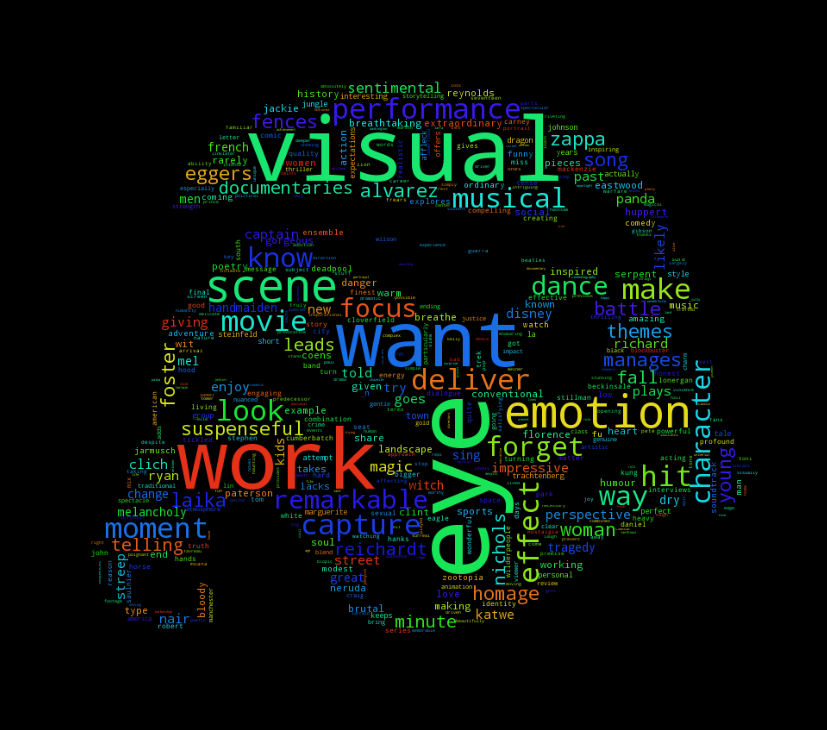

pic_topic_1.png


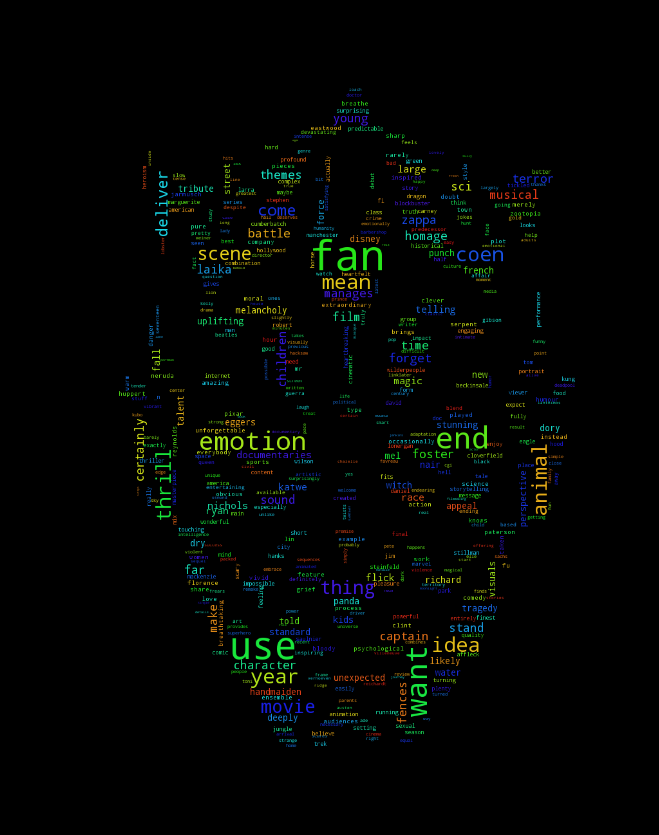

pic_topic_2.png


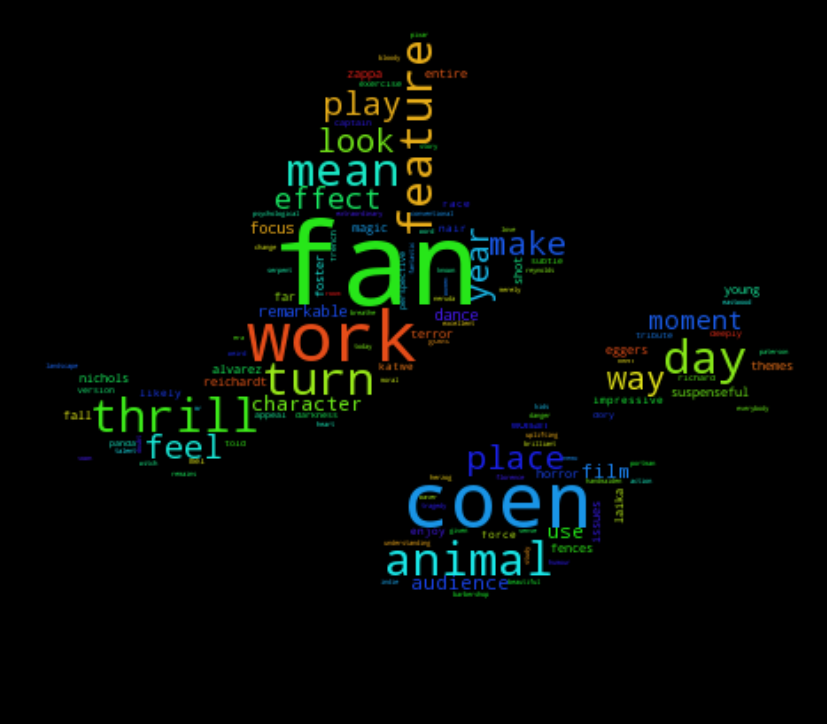

pic_topic_3.png


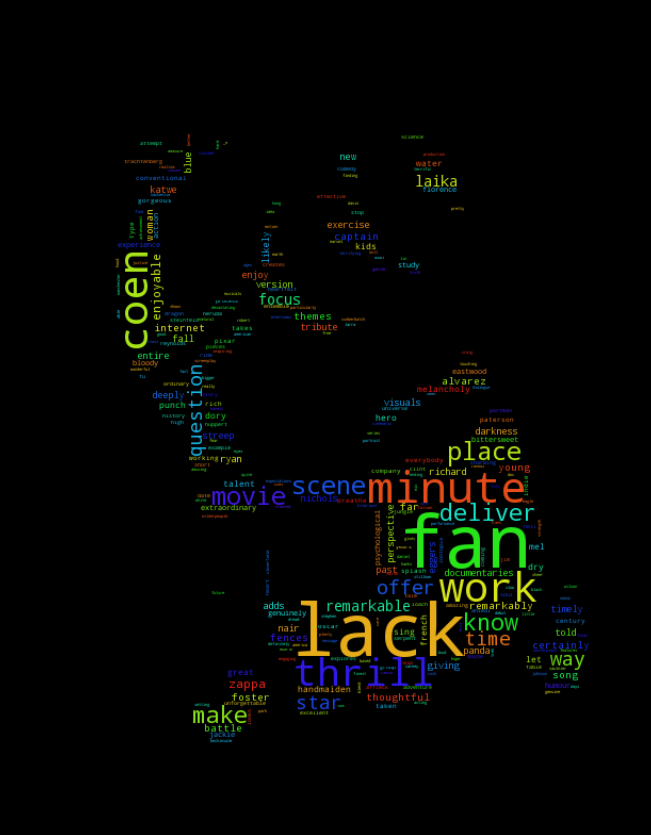

pic_topic_4.png


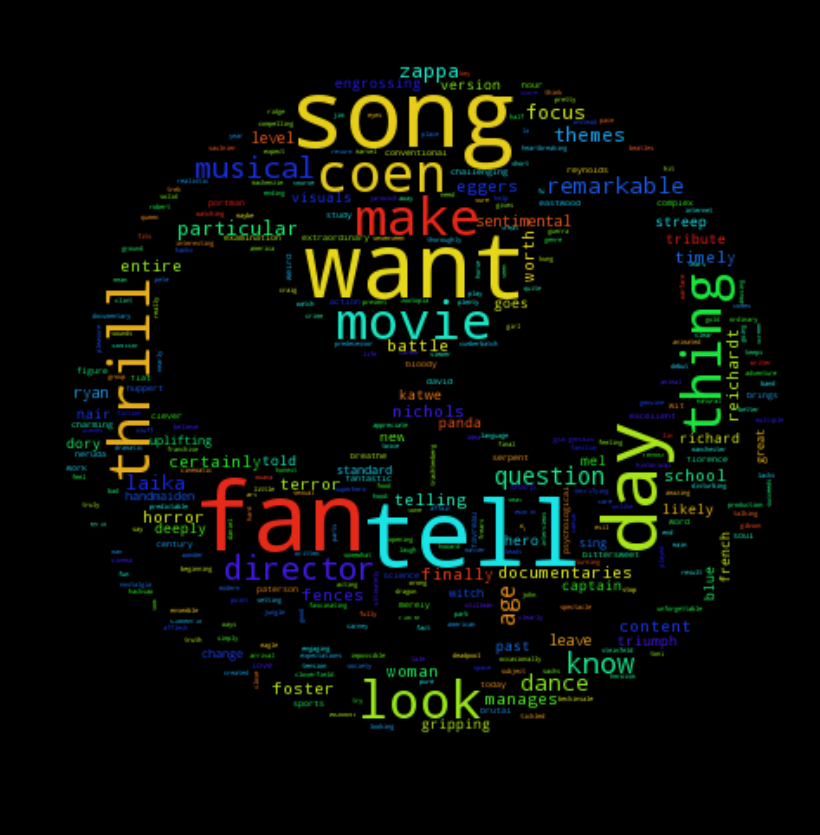

pic_topic_5.png


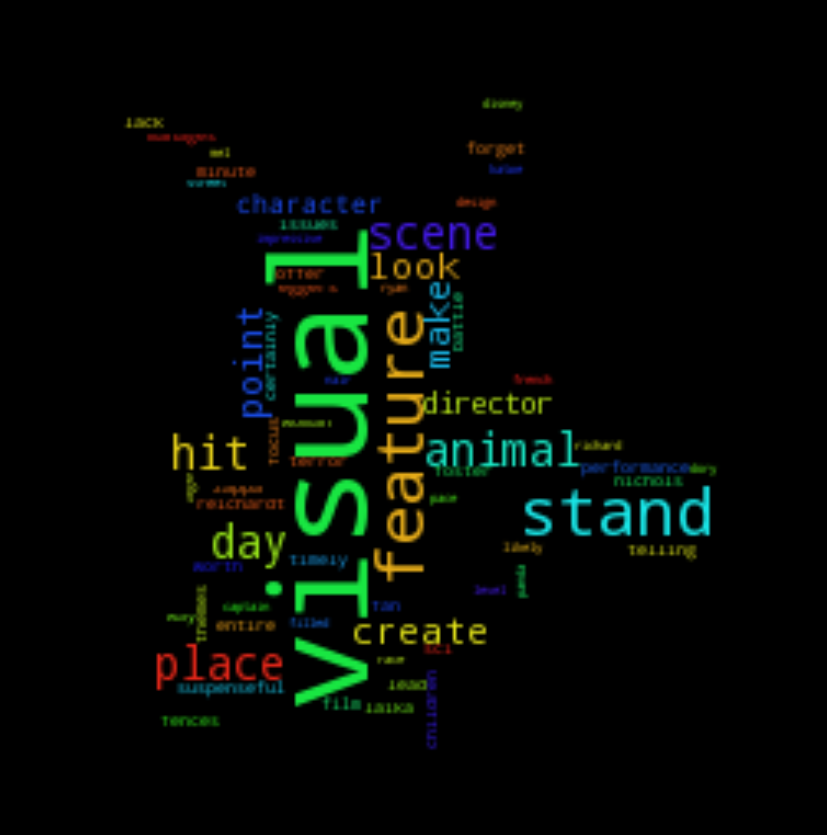

pic_topic_6.png


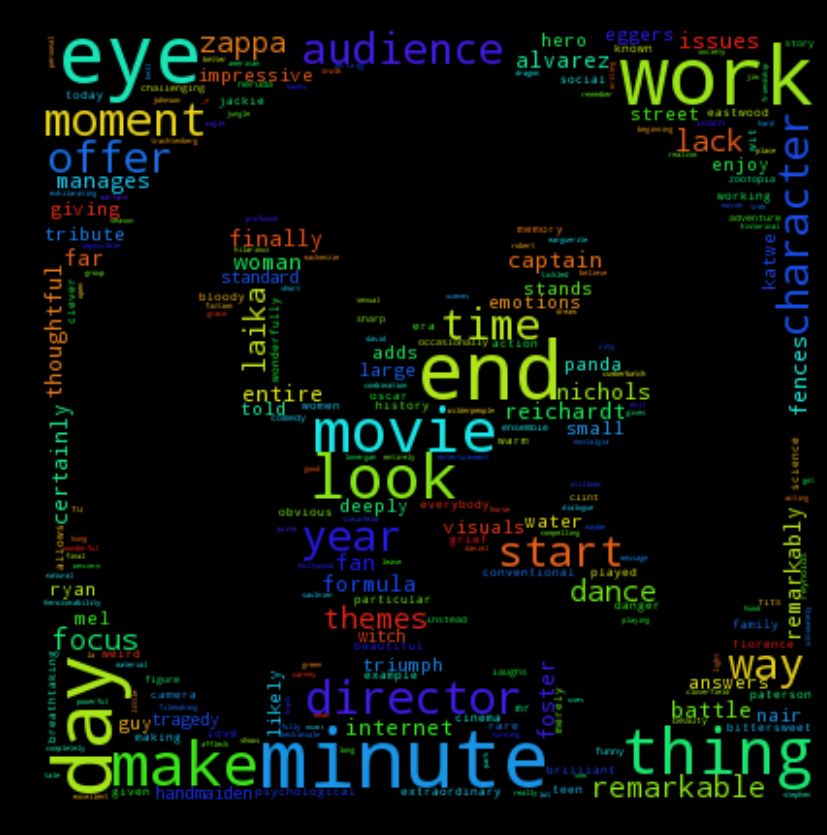

pic_topic_7.png


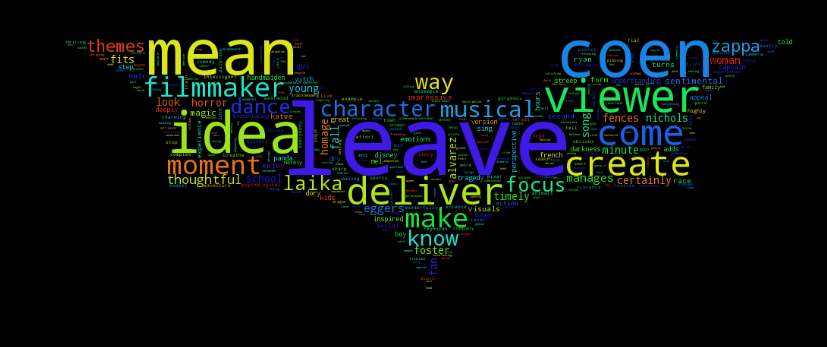

pic_topic_8.png


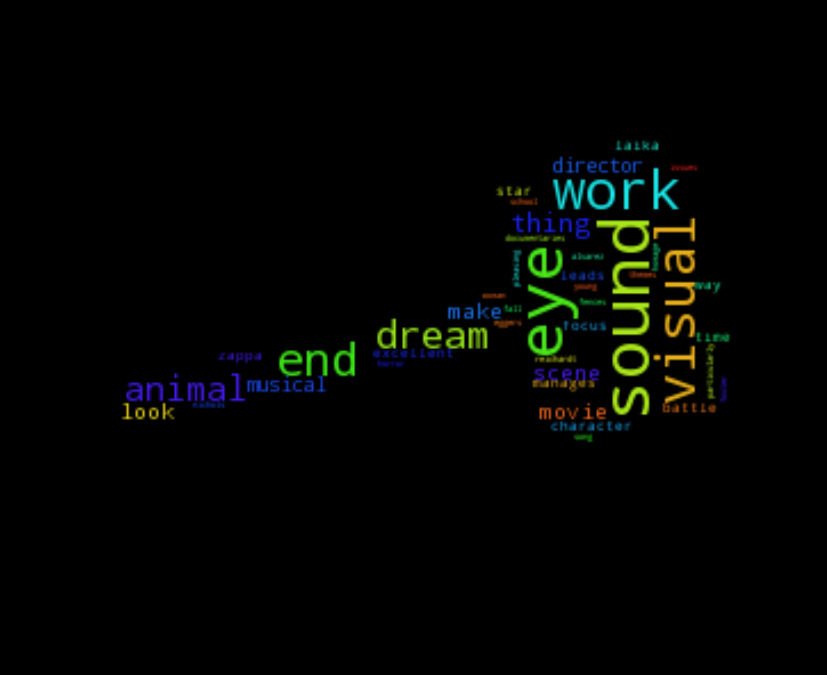

In [179]:
for i in range(0, len(topic_top_words)):
    wcplot(topic_top_words[i][1], i)


In [151]:
topic_top_words[3][1]

u'film performance character heart human think arrival quite book great set man comic filmmaker narrative different shows enjoyable delivers rich spirit zappa fine universe scene place fascinating let splash time portman jungle funny attention question date soul hilarious captain touching based deeply twice masterpiece davis job head hope classic ride lovely watch touch magical work future crafted political justice seen stars creates frank sheer amazing definitely single woman natalie equal early loud genuinely individual indie directors loach driver punch acting deserves journey taking shines paterson incredible blue paced remarkably measure adaptation process pixar motion pieces unlike lady years free beatles realism deadpool past unforgettable howard features care wants working bold thrill charming entire solid jarmusch kubo detailed final prince johnson laugh maybe fable family _n larra ways despite dread favreau class setting richard poignant daniel strings larrain dialogue genuin

In [ ]:
wcplot(topic_top_words[0][1], 1)
wcplot(topic_top_words[1][1], 2)

In [34]:

counts = tf_review_vectorizer.fit_transform(review_detail).toarray().ravel()                                                  
words = np.array(tf_review_vectorizer.get_feature_names()) 
# normalize                                                                                                                                             
counts = counts / float(counts.max())

NameError: name 'review_detail' is not defined

In [ ]:
## Example for TF-IDF in Scikit-Learn
import nltk
import string
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.porter import PorterStemmer

path = os.getcwd() + './movies/data'
token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

for subdir, dirs, files in os.walk(path):
    for file in files:
        file_path = subdir + os.path.sep + file
        shakes = open(file_path, 'r')
        text = shakes.read()
        lowers = text.lower()
        no_punctuation = lowers.translate(None, string.punctuation)
        token_dict[file] = no_punctuation
        
#this can take some time
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())



In [259]:
# type(reviews_movie)
# convert data frame to list
# reviews_movie = list(reviews_movie.values.tolist())
# reviews_movie[0]
# Get the first column of the tuple
# review_detail = [row[0] for row in reviews_movie]


In [327]:
from gensim import corpora, models, similarities
from pprint import pprint

In [49]:
stop_list = set('for a of the and to in u n got get ur na lt rt go like'.split())
texts = [[word for word in line.strip().lower().split() \
          if word not in stop_list] for line in review_detail]

AttributeError: 'float' object has no attribute 'strip'

In [354]:
# Here we assigned a unique integer id to all words appearing in the corpus with the gensim.corpora.dictionary.Dictionary class. This sweeps across the texts, collecting word counts and relevant statistics. In the end, we see there are twelve distinct words in the processed corpus, which means each document will be represented by twelve numbers (ie., by a 12-D vector). To see the mapping between words and their ids:
dictionary = corpora.Dictionary(texts)
V = len(dictionary)
print dictionary  # Dictionary(18803 unique tokens:

Dictionary(18803 unique tokens: [u'heptapods', u'raining', u'writings', u'hordes', u'overreaches']...)


In [ ]:
#  the mapping between words and their ids
# print(dictionary.token2id)

In [364]:
# To actually convert tokenized documents to vectors:

corpus = [dictionary.doc2bow(text) for text in texts]
print texts[0]
print corpus[0]

# The function doc2bow() simply counts the number of occurrences of each distinct word, converts the word to 
# its integer word id and returns the result as a sparse vector. The sparse vector [(0, 1), (1, 1)] therefore reads: 
# in the document “[u'one', u'disney', u'best', u'movies', u'past', u'years']”, the words one (id 0) and disney (id 1) 
# appear once; the other ten dictionary words appear (implicitly) zero times.
print '--' * 50
print texts[1]
print corpus[1]



[u'one', u'disney', u'best', u'movies', u'past', u'years']
[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]
----------------------------------------------------------------------------------------------------
[u'zootopia', u'pulls', u'together', u'various', u'elements', u'neo', u'noir', u'mystery', u'buddy', u'cop', u'comedy', u'timely', u'social', u'themes', u'mostly', u'entertaining', u'animated', u'film']
[(6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1)]


In [366]:
corpora.MmCorpus.serialize('./movies/data2/review_corpus.mm', corpus)  # store to disk, for later use
corpus_load = corpora.MmCorpus('./movies/data2/review_corpus.mm') # load a corpus iterator from a Matrix Market file:
# Corpus objects are streams, so typically you won’t be able to print them directly:
print corpus_load

# one way of printing a corpus: load it entirely into memory
print(list(corpus))  # calling list() will convert any sequence to a plain Python list

# another way of doing it: print one document at a time, making use of the streaming interface
for doc in corpus:
     print(doc)
        
# The second way is obviously more memory-friendly, but for testing and development purposes, nothing beats the simplicity of calling list(corpus).

MmCorpus(13468 documents, 18803 features, 170361 non-zero entries)


In [365]:
print '--' * 50
print corpus[0:10]

# how to understand it?

----------------------------------------------------------------------------------------------------
[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)], [(6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1)], [(24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1)], [(9, 1), (23, 2), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1)], [(32, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 2)], [(62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1)], [(35, 1), (67, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1)], [(3, 1), (23, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1)], [(33, 1), (73, 1), (86, 1), (87, 1), (88, 1), (89, 1), (9

In [345]:

## step 1 -- initialize a model
# apply a transformation to a whole corpus:
corpus_tfidf = models.TfidfModel(corpus)[corpus]
# From now on, tfidf is treated as a read-only object that can be used to convert any vector from the old representation (bag-of-words integer counts) to the new representation (TfIdf real-valued weights):

## step 2 -- use the model to transform vectors
# A transformation is used to convert documents from one vector representation into another:
# vec = [(0, 1), (4, 1)]
# print(corpus_tfidf[vec]) 

# ? what's the document? a review or reviews for one movie or whole reviews?
print 'TF-IDF:'
# for c in corpus_tfidf:
#     print c

TF-IDF:
[(0, 0.2586771162652556), (1, 0.5143161635253752), (2, 0.3898822816655681), (3, 0.4206585118111928), (4, 0.48042495387471107), (5, 0.32984105268410097)]
[(6, 0.2504520077651356), (7, 0.30226974968477194), (8, 0.22889915828585772), (9, 0.2802843441647005), (10, 0.2848189515821277), (11, 0.22397505532525766), (12, 0.30226974968477194), (13, 0.2549866151825629), (14, 0.19972391806636924), (15, 0.21955692690661613), (16, 0.21750706503117057), (17, 0.28727899048520944), (18, 0.21322341438181405), (19, 0.26736815347948345), (20, 0.1693978214086928), (21, 0.17747446899553884), (22, 0.1638763724908482), (23, 0.07313793917138678)]
[(24, 0.3181184895838593), (25, 0.34165992361909614), (26, 0.3246031673554219), (27, 0.24922897623858598), (28, 0.2306423373041168), (29, 0.22704466431498926), (30, 0.28895977215727847), (31, 0.2739554784154364), (32, 0.1403515837327735), (33, 0.23984196588808784), (34, 0.17327453954950991), (35, 0.14814446164237466), (36, 0.34165992361909614), (37, 0.32460316

In [348]:
print corpus[0]
print corpus_tfidf[0]

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]
[(0, 0.2586771162652556), (1, 0.5143161635253752), (2, 0.3898822816655681), (3, 0.4206585118111928), (4, 0.48042495387471107), (5, 0.32984105268410097)]


In [350]:
file_object = open('topicLSI10.txt', 'w')

# Transformations can also be serialized, one on top of another, in a sort of chain
# 
lsi = models.LsiModel(corpus_tfidf, num_topics=10, id2word=dictionary)  ## initialize an LSI transformation
topic_result = [a for a in lsi[corpus_tfidf]]  ## create a double wrapper over the original corpus: bow->tfidf->fold-in-lsi
for topic in topic_result:
    p = []
    for prob in topic:
        p.append(prob[1])
    if p:
        file_object.writelines(str(p)+"\n")
    else:
        file_object.writelines(",,,,,,,,,,\n")


In [368]:
lsi.print_topics(2)  # how to understand it?

[(0,
  u'0.291*"one" + 0.253*"film" + 0.231*"best" + 0.202*"movie" + 0.179*"year" + 0.148*"story" + 0.147*"films" + 0.124*"good" + 0.118*"movies" + 0.107*"great"'),
 (1,
  u'-0.460*"one" + -0.449*"best" + -0.438*"year" + -0.287*"films" + 0.150*"story" + 0.144*"film" + -0.142*"movies" + -0.100*"2016" + 0.084*"movie" + 0.077*"great"')]

In [ ]:
pprint(lsi.print_topics(num_topics=10, num_words=10))


In [353]:
# To transform the whole corpus via TfIdf and index it, in preparation for similarity queries:
similarity = similarities.MatrixSimilarity(lsi[corpus_tfidf], num_features=12)   # similarities.Similarity()
print 'Similarity:'

# and to query the similarity of our query vector vec against every document in the corpus:
pprint(list(similarity))

Similarity:
[array([ 1.        ,  0.18130925,  0.20159644, ...,  0.00641848,
        0.04112606,  0.16702856], dtype=float32),
 array([ 0.18130925,  1.        ,  0.64194679, ...,  0.66373128,
        0.52945131,  0.27902448], dtype=float32),
 array([ 0.20159644,  0.64194679,  1.        , ...,  0.39138502,
        0.68489087,  0.80909097], dtype=float32),
 array([-0.05334255,  0.49675179,  0.19130138, ...,  0.88387775,
        0.54175973,  0.14194816], dtype=float32),
 array([-0.01036823,  0.4737764 ,  0.81959069, ...,  0.27848053,
        0.61341274,  0.71039456], dtype=float32),
 array([-0.02714741,  0.34992248,  0.52882773, ...,  0.12475921,
        0.80585885,  0.57728386], dtype=float32),
 array([ 0.12072834,  0.63496977,  0.91716278, ...,  0.29578239,
        0.55801201,  0.60900986], dtype=float32),
 array([ 0.36569762,  0.76580143,  0.63417232, ...,  0.62763643,
        0.56697589,  0.48117509], dtype=float32),
 array([-0.07167771,  0.34406772,  0.51812017, ...,  0.04538134,
   

In [64]:
from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string
stop = set(stopwords.words('english'))
exclude = set(string.punctuation) 
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in review_detail]   

UnicodeDecodeError: 'ascii' codec can't decode byte 0xed in position 1: ordinal not in range(128)

In [335]:
# Importing Gensim
import gensim
from gensim import corpora

# Creating the term dictionary of our courpus, where every unique term is assigned an index. dictionary = corpora.Dictionary(doc_clean)

# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above.
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

In [339]:
# Creating the object for LDA model using gensim library
Lda = gensim.models.ldamodel.LdaModel

# Running and Trainign LDA model on the document term matrix.
ldamodel = Lda(doc_term_matrix, num_topics=7, id2word = dictionary, passes=50)

In [338]:
print(ldamodel.print_topics(num_topics=3, num_words=3))

# [(0, u'0.027*fascinating + 0.023*compelling + 0.019*cut'), (1, u'0.060*fun + 0.052*go + 0.017*pixar'), (2, u'0.016*joke + 0.005*afraid + 0.001*unmissable')]

[(0, u'0.027*fascinating + 0.023*compelling + 0.019*cut'), (1, u'0.060*fun + 0.052*go + 0.017*pixar'), (2, u'0.016*joke + 0.005*afraid + 0.001*unmissable')]


In [374]:
for item in ldamodel.print_topics(num_topics=7, num_words=7):
    print item


(0, u'0.116*go + 0.049*compelling + 0.006*boring + 0.004*mesmerising + 0.001*fuss + 0.000*fascinating + 0.000*magnificent')
(1, u'0.130*fun + 0.055*fascinating + 0.013*magnificent + 0.000*fuss + 0.000*afraid + 0.000*boring + 0.000*compelling')
(2, u'0.044*cut + 0.041*pixar + 0.002*unmissable + 0.000*fun + 0.000*compelling + 0.000*nope + 0.000*boring')
(3, u'0.022*honest + 0.000*joke + 0.000*nope + 0.000*cut + 0.000*unmissable + 0.000*pixar + 0.000*boring')
(4, u'0.018*mesmerizing + 0.000*go + 0.000*nope + 0.000*cut + 0.000*unmissable + 0.000*pixar + 0.000*boring')
(5, u'0.036*joke + 0.001*yikes + 0.001*nope + 0.000*afraid + 0.000*honest + 0.000*fascinating + 0.000*go')
(6, u'0.011*afraid + 0.000*joke + 0.000*fun + 0.000*go + 0.000*nope + 0.000*cut + 0.000*unmissable')


In [147]:
from sklearn.feature_extraction.text import TfidfVectorizer
tf = TfidfVectorizer(analyzer='word', ngram_range=(1,3), min_df = 0, stop_words = 'english')


with open('./movies/data2/zootopia_tk.txt', 'r') as infile:
    comments = infile.readlines()
    tfidf_matrix =  tf.fit_transform(comments)
    feature_names = tf.get_feature_names() 
    f

    dense = tfidf_matrix.todense()
    print dense


[[ 0.00546228  0.00546228  0.00546228 ...,  0.00546228  0.00546228
   0.00546228]]


In [1]:
## example: How to do TF-IDF
import nltk
import string
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.porter import PorterStemmer

path = '/opt/datacourse/data/parts'
token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

for subdir, dirs, files in os.walk(path):
    for file in files:
        file_path = subdir + os.path.sep + file
        shakes = open(file_path, 'r')
        text = shakes.read()
        lowers = text.lower()
        no_punctuation = lowers.translate(None, string.punctuation)
        token_dict[file] = no_punctuation
        
#this can take some time
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())

In [ ]:
## example: How Sentiment analysis works
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import pandas as pd
import math

[data_df, reviews] = get_tokens()

sid = SentimentIntensityAnalyzer()
for i in range(0, len(reviews)):
    sentence = reviews[i]
    ss = sid.polarity_scores(str(sentence))
    for k in sorted(ss):
        print '{0}: {1}, '.format(k, ss[k])
    